In [4]:
import numpy as np 
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval
from matplotlib.colors import LogNorm
from astropy.nddata import Cutout2D
from astropy.modeling import models, fitting
from astropy.visualization.lupton_rgb import make_lupton_rgb
from astropy.visualization import LogStretch
from scipy.optimize import least_squares
import matplotlib.pyplot as plt
from PIL import Image
import os

def sersic_2d(x, y, I_e, R_e, n , x0, y0):
    r = np.sqrt((x-x0)**2+(y-y0)**2)
    b_n = 2 * n - 1/3+(4/(405*n))+(46/(25515*n**2))
    return I_e * np.exp(-b_n *((r/R_e)**(1/n)-1))
def residuals(params, x, y, data):
    I_e, R_e, n, x0, y0 = params
    model = sersic_2d(x, y, I_e, R_e, n, x0, y0)
    return(model - data).ravel()
def two_component_model(x, y, params):
    I_e_bulge, R_e_bulge, n_bulge, I_e_disk, R_e_disk, n_disk, x0, y0 = params
    bulge = sersic2d(x, y,  I_e_bulge, R_e_bulge, n_bulge, x0, y0)
    disk = sersic2d(x, y, I_e_disk, R_e_disk, n_disk, x0, y0)
    return bulge + disk
def residuals_two_components(params, x, y, data): 
    model = two_component_model(x, y, params)
    return (model-data).ravel()
def sersic_2d_elliptical(x, y, I_e, R_e, n, x0, y0, q, theta):
    x_shift = x-x0
    y_shift = y-y0
    x_rot = x_shift*np.cos(theta) + y_shift*np.sin(theta)
    y_rot = -x_shift*np.sin(theta) + y_shift*np.cos(theta)
    R = np.sqrt(x_rot**2 + (y_rot/q)**2)
    b_n = 2 * n - 1/3+(4/(405*n))+(46/(25515*n**2))
    return I_e * np.exp(-b_n *((R/R_e)**(1/n)-1))

def residuals_elliptical(params, x, y, data):
    I_e, R_e, n, x, y, q, theta = params
    model = sersic_2d_elliptical(x, y, I_e, R_e, n, x0, y0, q, theta)
    return (model-data).ravel()

def two_component_ellipse(x, y, params): 
    I_e_bulge, R_e_bulge, n_bulge, q_bulge, theta_bulge, I_e_disk, R_e_disk, n_disk, q_disk, theta_disk, x0, y0 = params
    bulge = sersic_2d_elliptical(x, y, I_e_bulge, R_e_bulge, n_bulge,  x0, y0, q_bulge, theta_bulge)
    disk = sersic_2d_elliptical(x, y, I_e_disk, R_e_disk, n_disk, x0, y0, q_disk, theta_disk)
    return bulge + disk

def residuals_two_ellipse(params, x, y, data):
    model = two_component_ellipse(x, y, params)
    return(model-data).ravel()

def get_gal_fit(data, input_params, bounds_lower, bounds_upper): 
    y = np.zeros(shape = data.shape, dtype = int)
    x = np.zeros(shape = data.shape, dtype = int)
    for i in range(len(y[0])):
        y[i] += len(y[0]) - (i+1)
        x[:,i] += i

    result = least_squares(residuals_two_ellipse, input_params, args = (x, y, data), bounds = (bounds_lower, bounds_upper))
    I_e_bulge_fit, R_e_bulge_fit, n_bulge_fit, q_bulge_fit, theta_bulge_fit, I_e_disk_fit, R_e_disk_fit, n_disk_fit, q_disk_fit, theta_disk_fit, x0_fit, y0_fit = result.x

    model_image = two_component_ellipse(x, y, np.array(result.x))

    return model_image, n_disk_fit
def plot_sersic_fit(data, model_image, residual):
    plt.subplot(1, 3, 1)
    plt.title('Data')
    plt.imshow(data, origin = 'lower', cmap = 'inferno')


    plt.subplot(1, 3, 2)
    plt.title('Model')
    plt.imshow(model_image, origin = 'lower', cmap = 'inferno')

    plt.subplot(1, 3, 3)
    plt.title('Residuals')
    plt.imshow(residual, origin = 'lower', cmap = 'coolwarm')
    plt.show()

1.0413954816162658


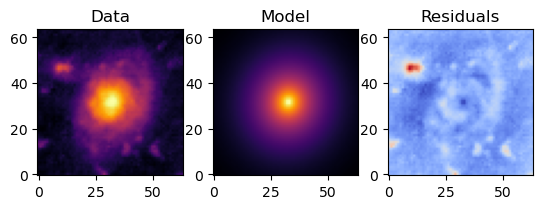

1.0413954816162658


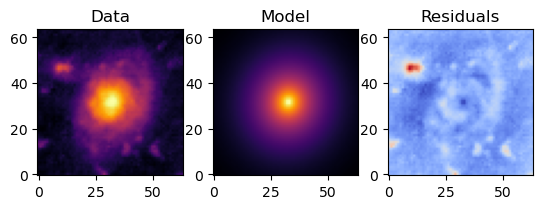

0.8753648979111064


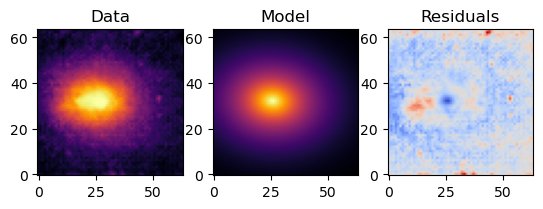

0.9556080517970579


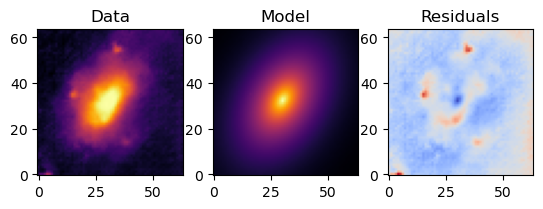

0.8506343563795988


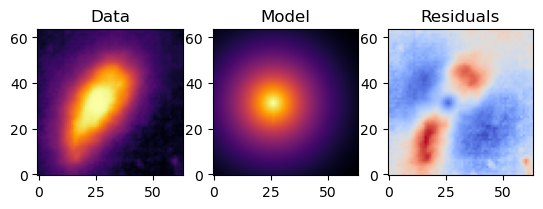

0.8438428628771443


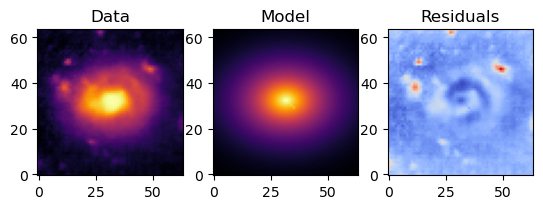

0.6074011532032592


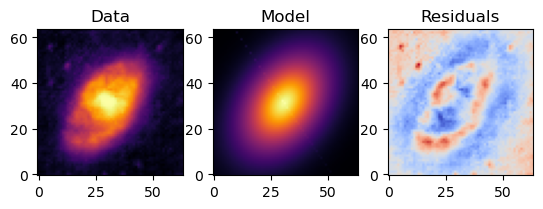

0.9278831167253312


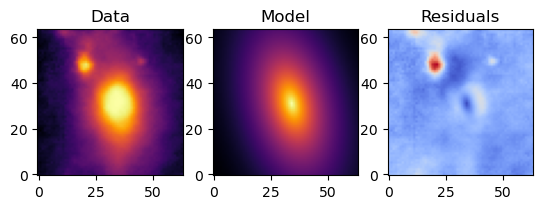

0.8717143379095353


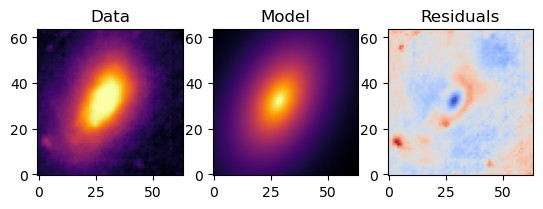

0.8666605112696385


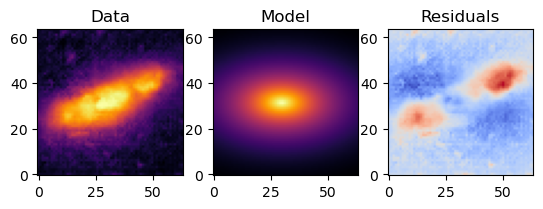

1.1683513925729725


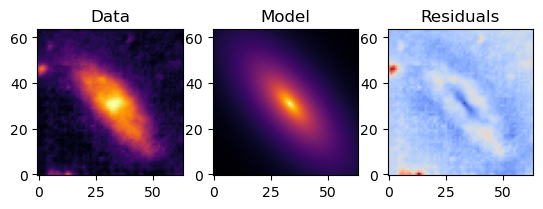

0.7582156330610226


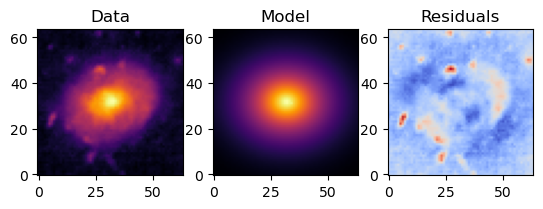

0.7888160194901987


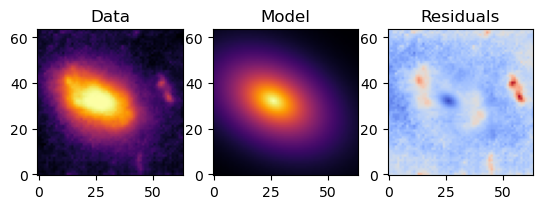

1.6521053202958758


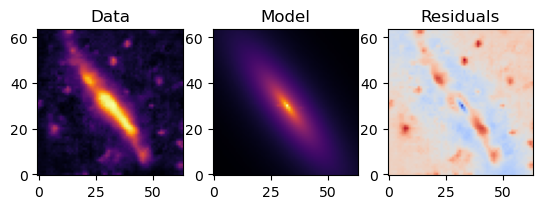

0.8486888238399184


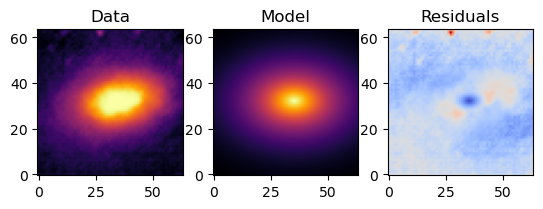

0.616393202676222


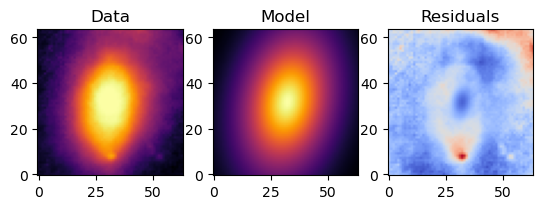

0.5347961772491887


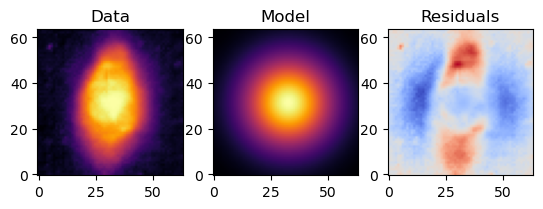

0.5000003829344901


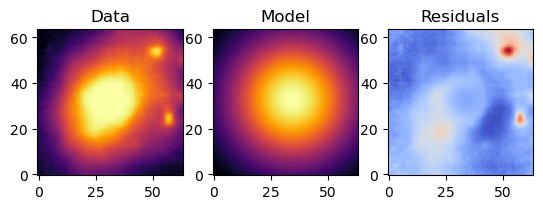

0.7815448982346579


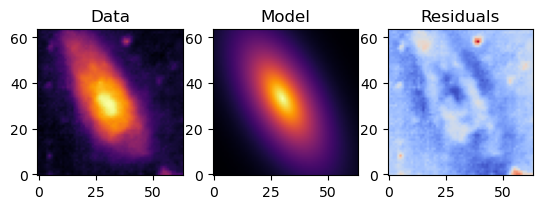

0.8019926036153456


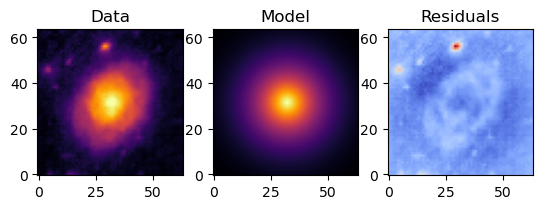

0.8961824996746824


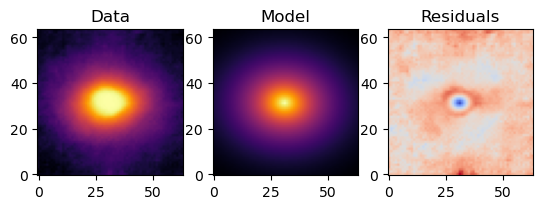

0.990657048969358


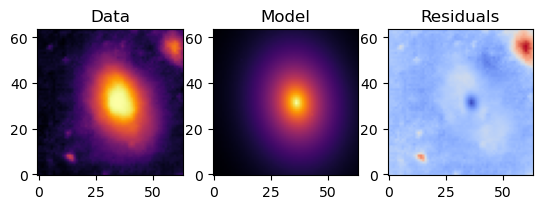

0.8078139997148196


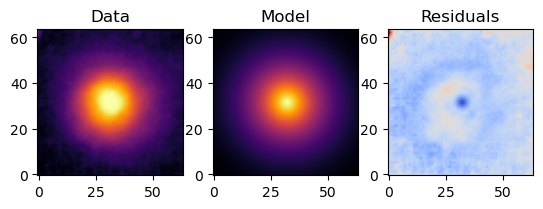

0.7978703003232389


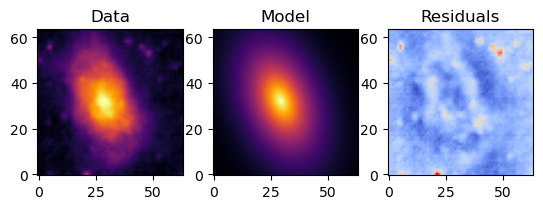

0.858359530672006


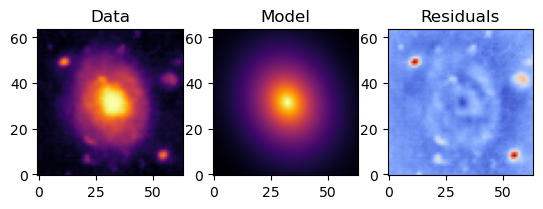

0.741504850807305


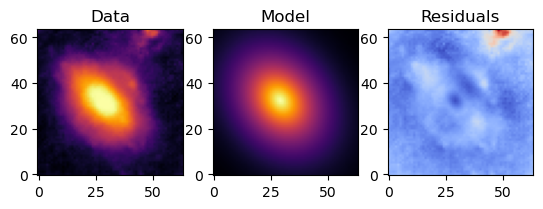

0.8995086704033397


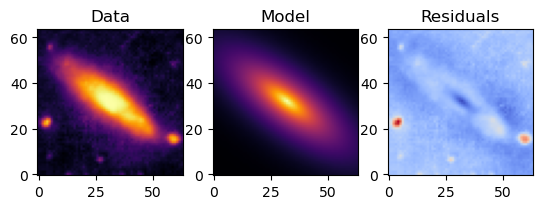

0.5829515520679028


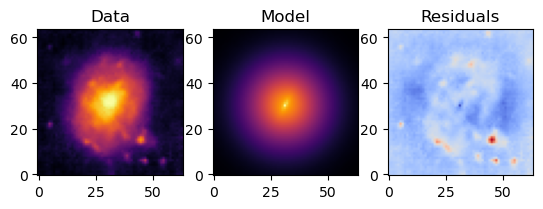

0.8701736449568954


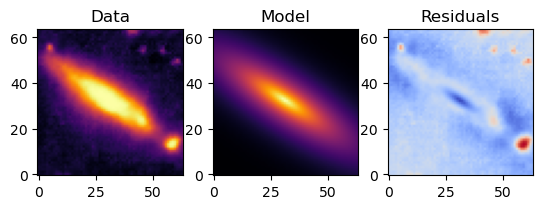

0.6297013582784038


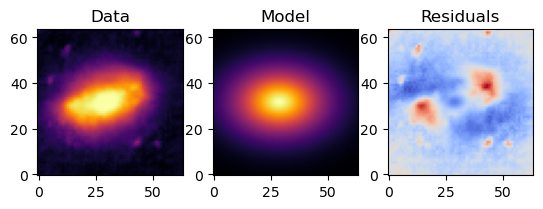

0.7410169562707329


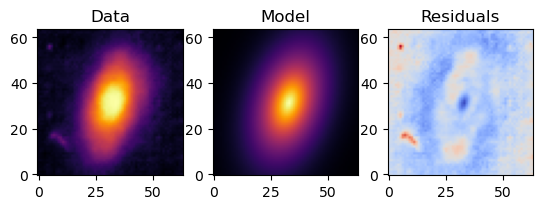

0.9096681039740703


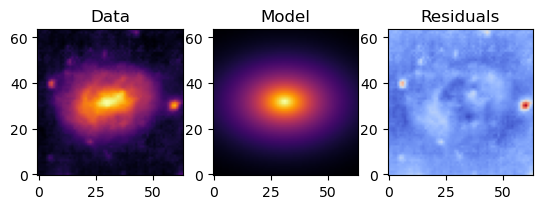

0.9024556528908817


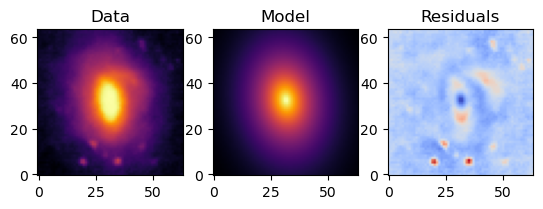

0.7699729646476555


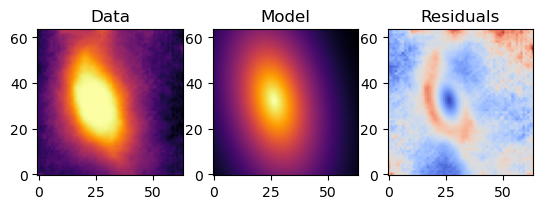

0.9524665193433234


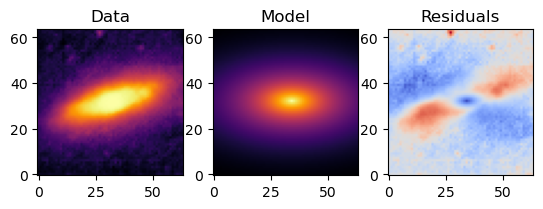

0.8657646765633987


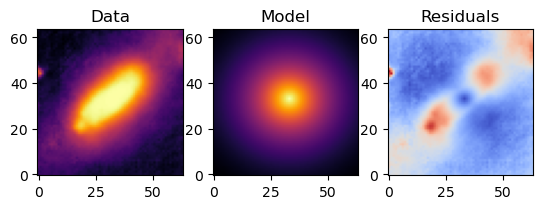

0.7925698007532632


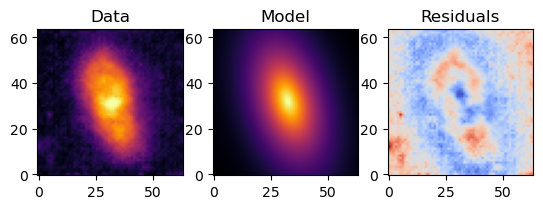

0.9169680507200313


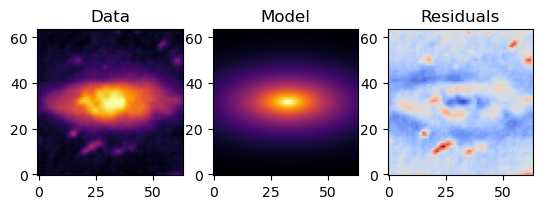

0.5136738411403898


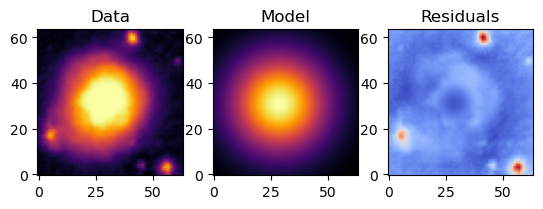

0.836746324435519


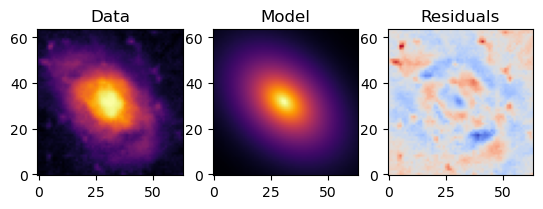

0.8298291052537266


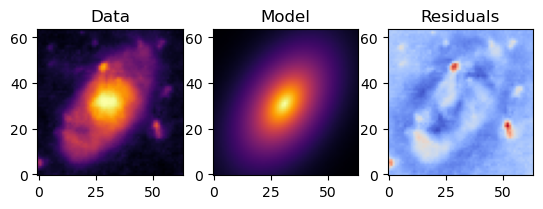

0.9249049138256311


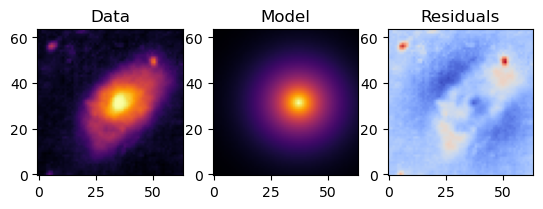

1.0648416175429867


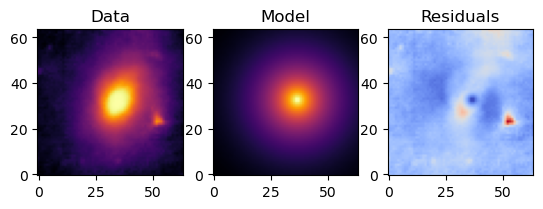

0.7131737935991536


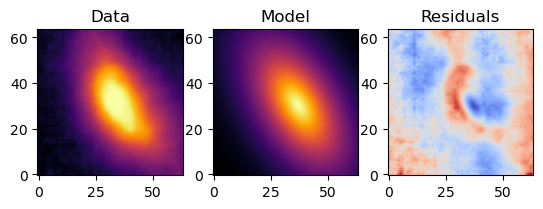

1.1768035206036855


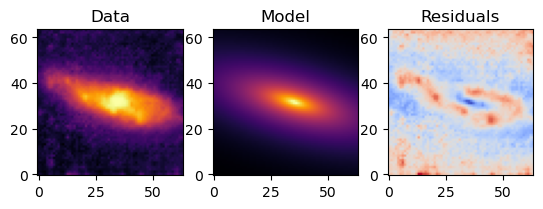

0.9463659147238543


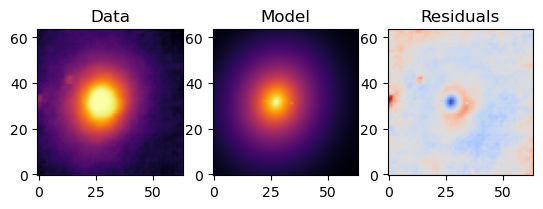

0.7782367358802385


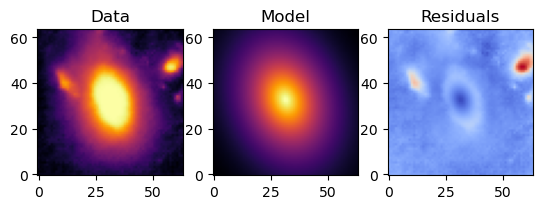

0.6762904921717503


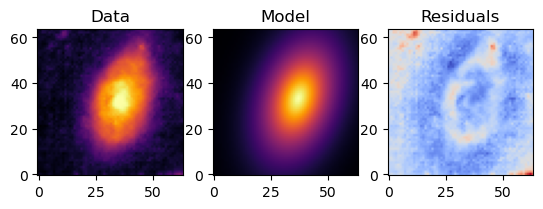

0.5000000000000001


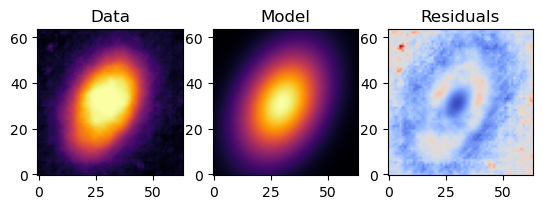

0.639292238380939


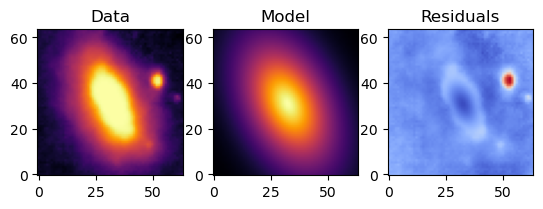

0.5664714121204096


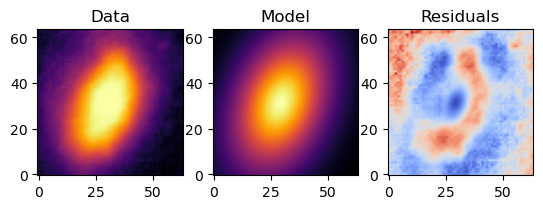

1.008090129271192


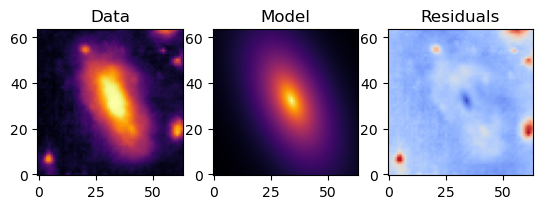

1.0005896702411787


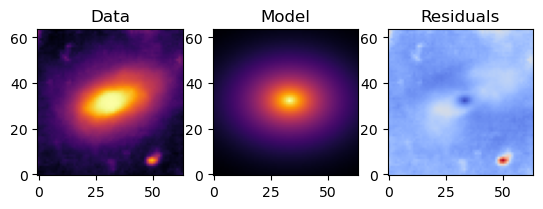

0.6426875536600695


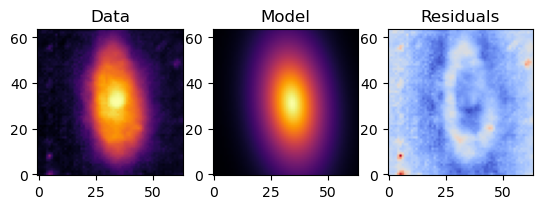

0.6384382538194537


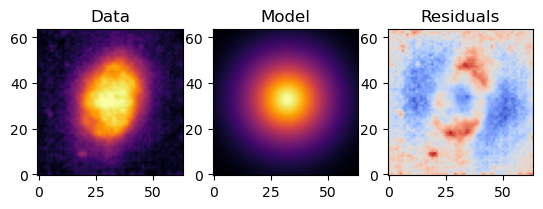

0.7552594652420442


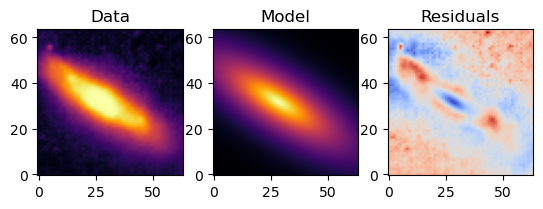

0.6324834811131212


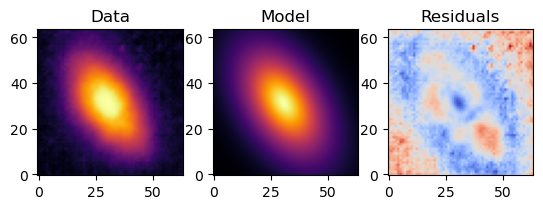

0.8582665282058594


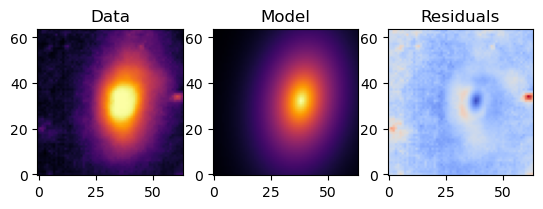

0.7713649981551454


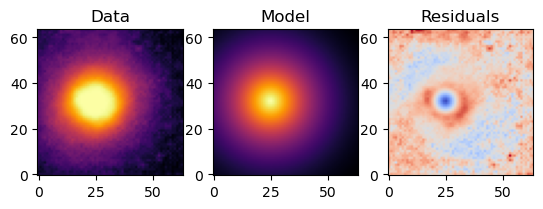

1.1410723627399968


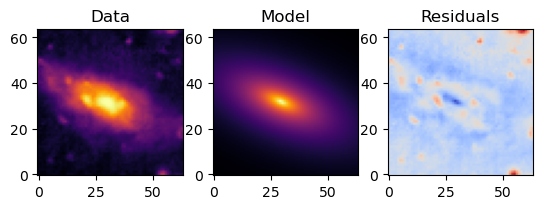

0.8848680717604764


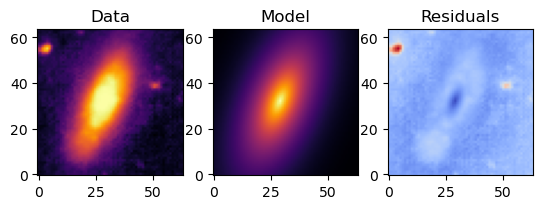

1.1642868379358386


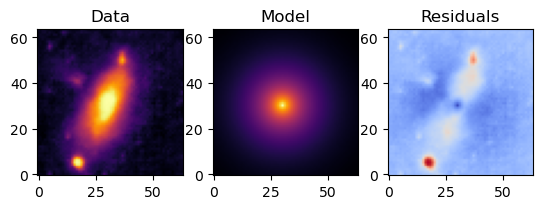

0.834348601634755


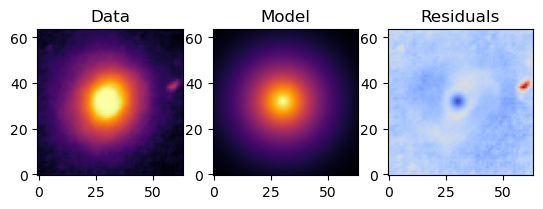

0.6682844295333411


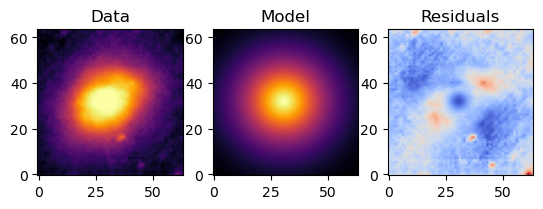

0.9211973744792836


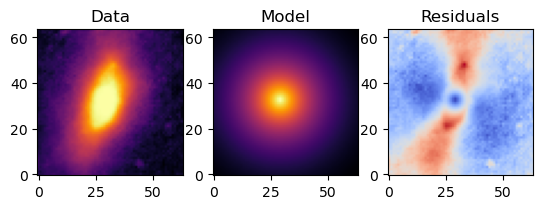

0.7018620584456768


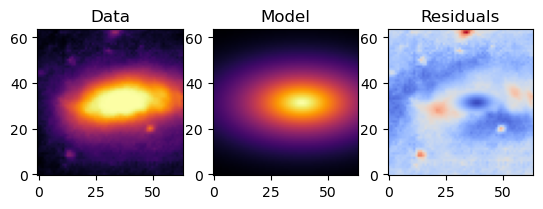

0.9003184683248077


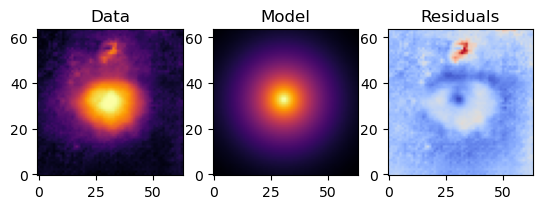

0.6076416910827802


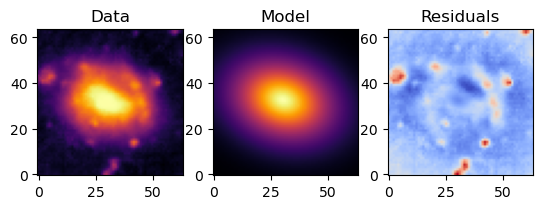

1.0029741141673614


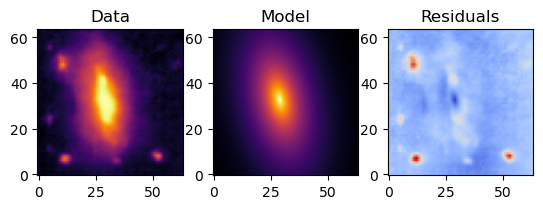

0.9238172867852884


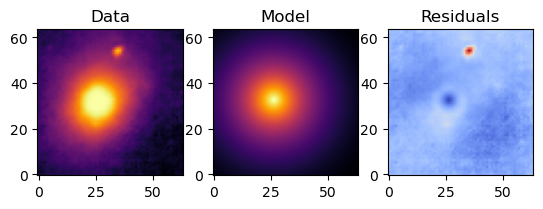

1.1278601242834314


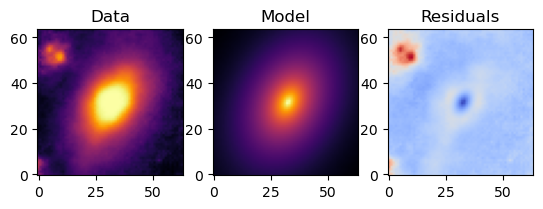

1.3318198531465226


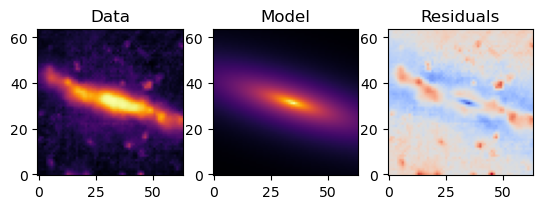

1.6658004511896747


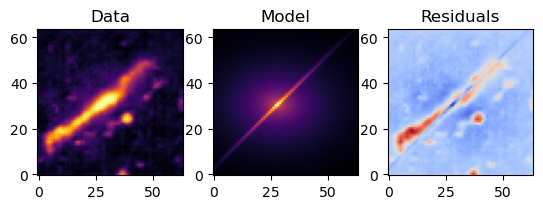

0.8823093875230902


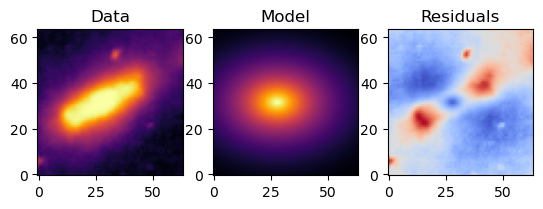

2.1768969669859195


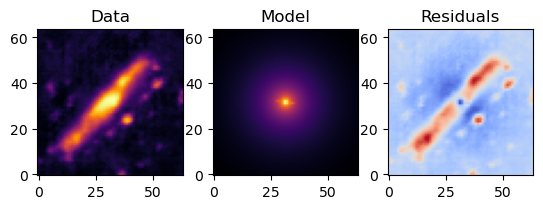

1.9403699744855107


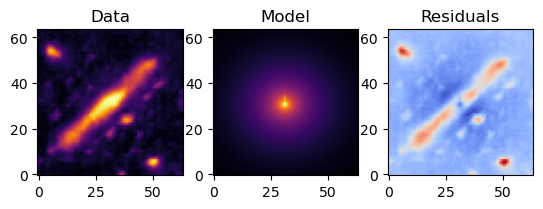

1.2409413717444444


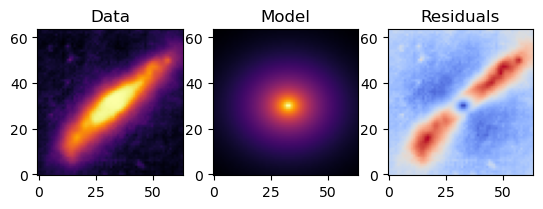

0.930079170113646


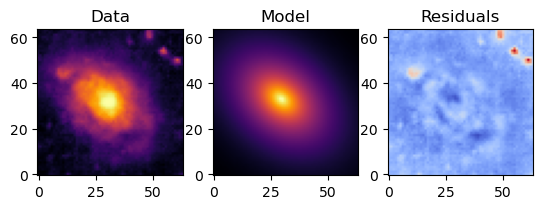

0.5790988656615501


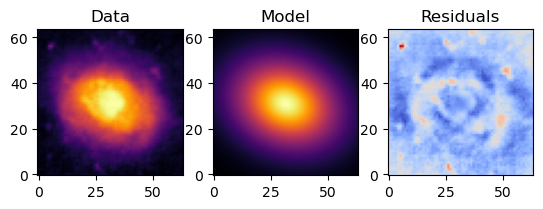

1.4041351361782262


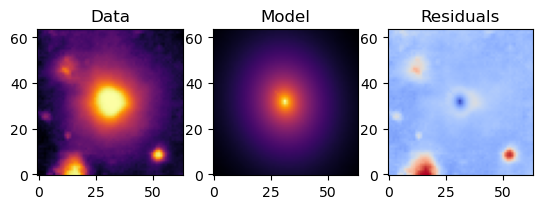

1.0762507048041872


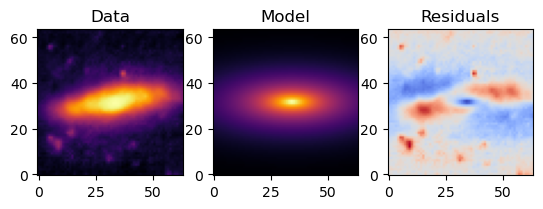

0.6441990350892731


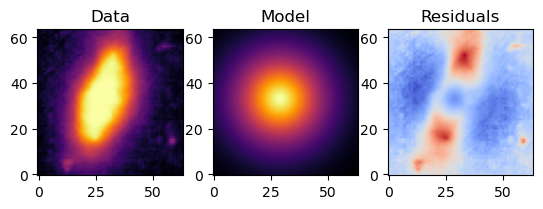

0.599734944786791


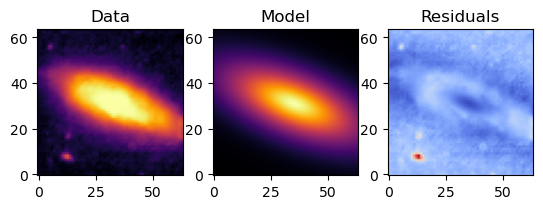

0.8148840762858081


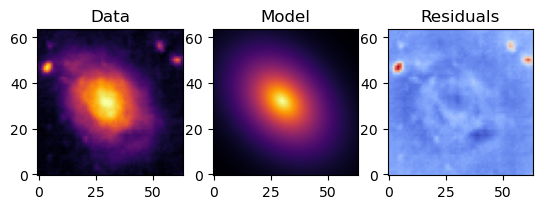

0.9315362317773246


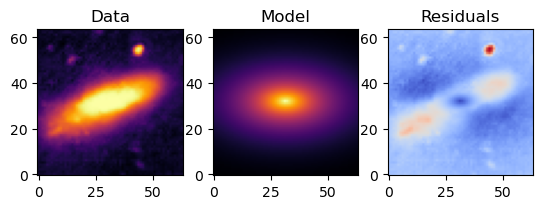

1.1091038366764057


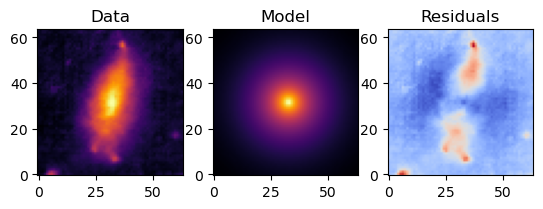

1.1454931169970537


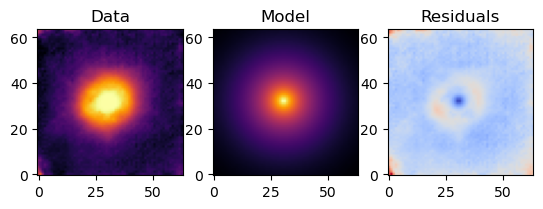

1.270942409222303


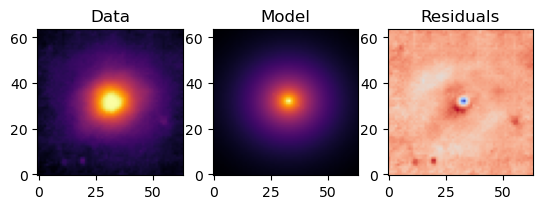

0.5161748258646445


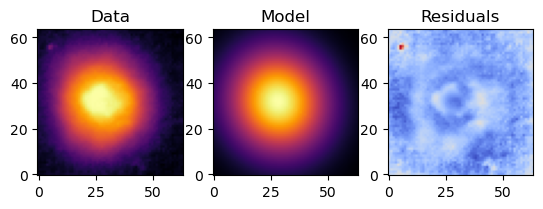

0.9909853957579464


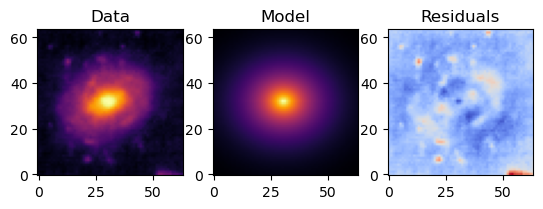

0.7638230740859246


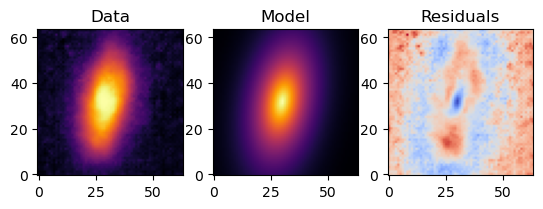

0.7524179053443972


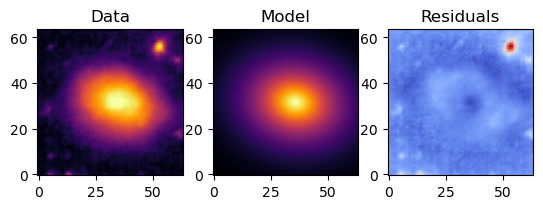

0.9778923819238545


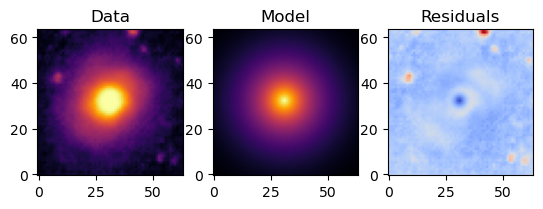

0.8941627107948664


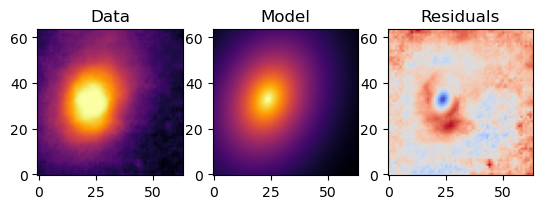

0.7484429960832094


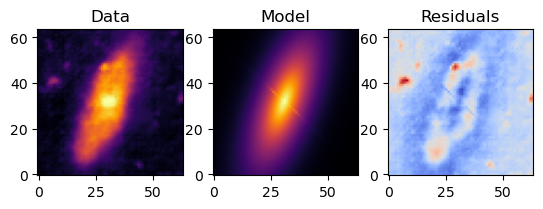

1.2488601871725578


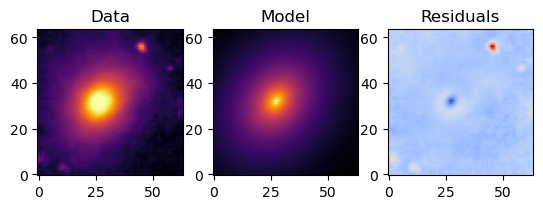

0.5557741435356598


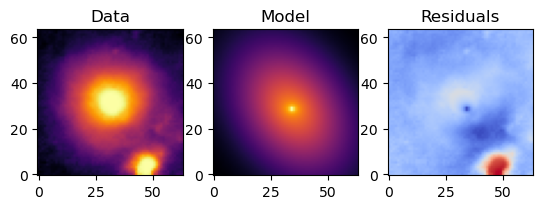

0.8205778038852112


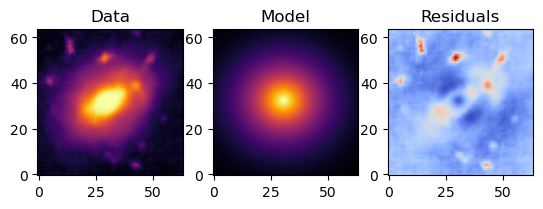

0.6600478729410265


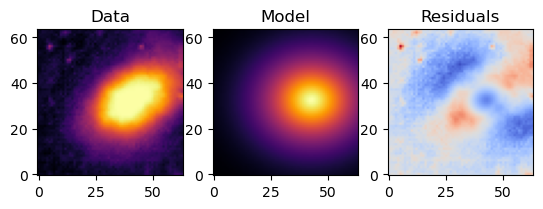

0.8634203456066392


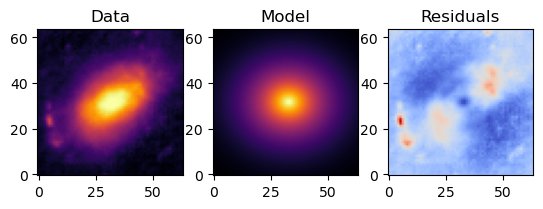

1.571980572006174


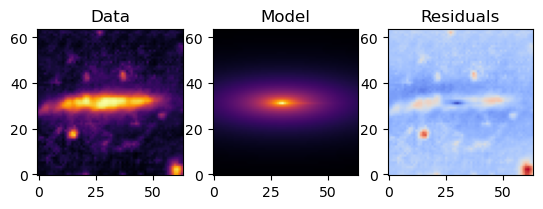

0.9392798091043149


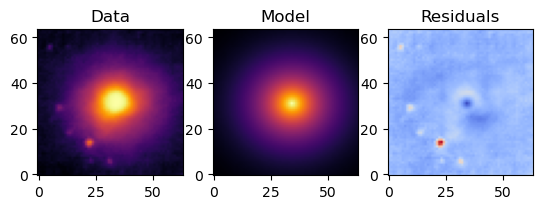

1.017960731996466


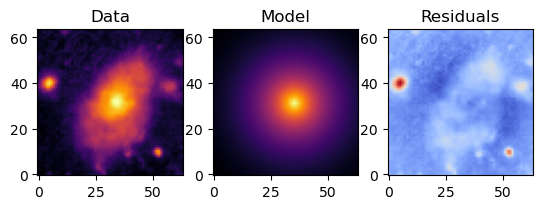

0.6417054016676985


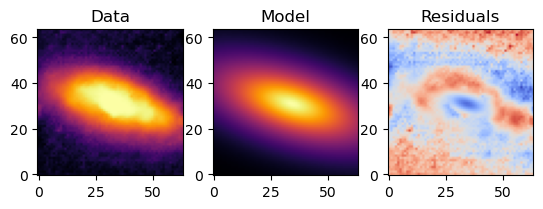

0.6491529114408812


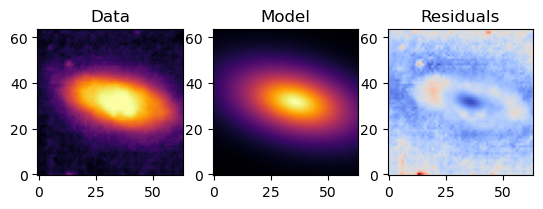

0.6473834746719548


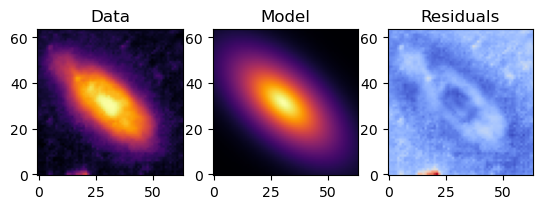

0.7348921009983722


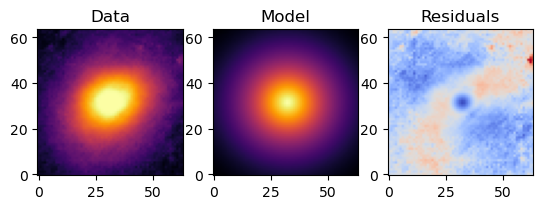

0.9783085578006944


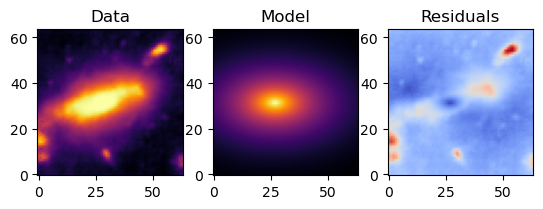

0.600760303531844


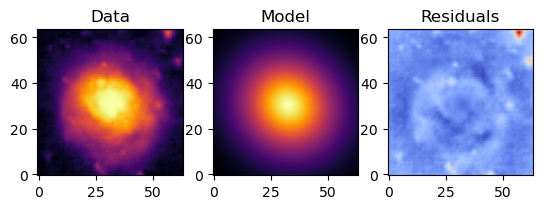

0.7186844772686076


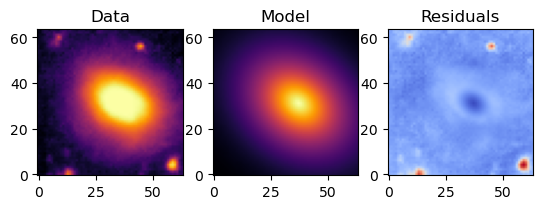

1.9008512489035962


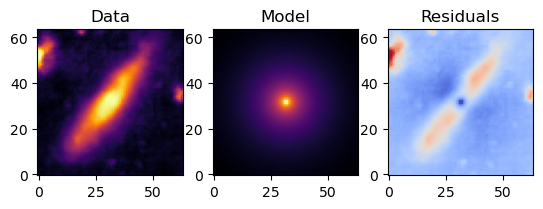

0.638408685116089


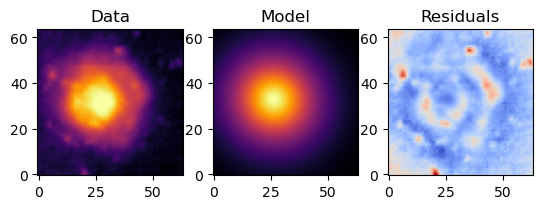

0.7699413331669854


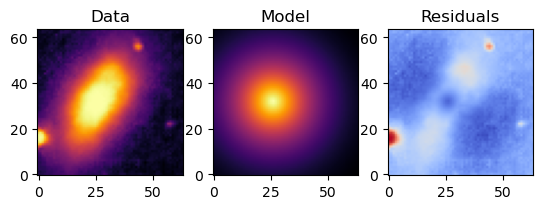

1.2634852793367255


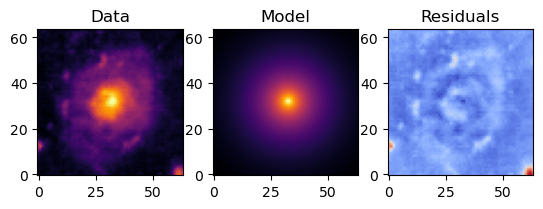

1.1633513666617605


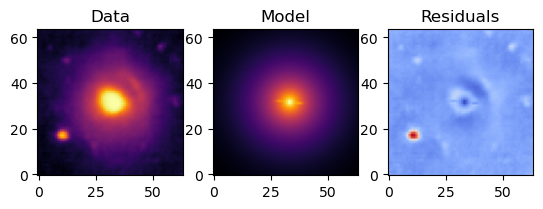

1.5019204449215613


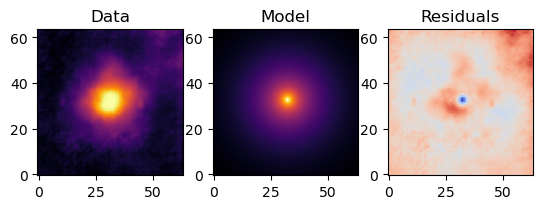

1.0339490356806054


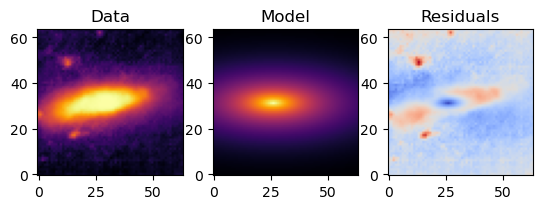

0.8735513910214854


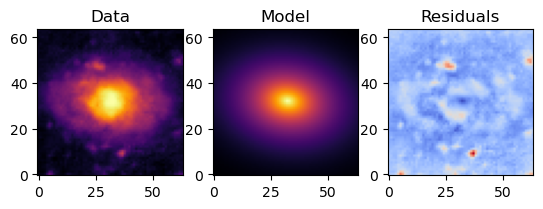

0.6739736782000332


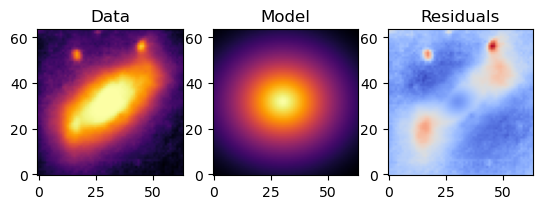

0.8221970673525943


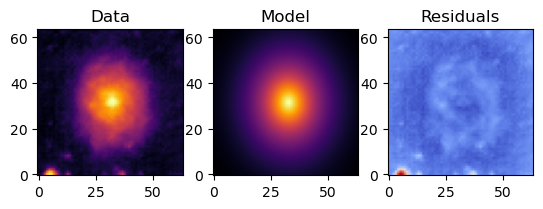

0.6628594159531713


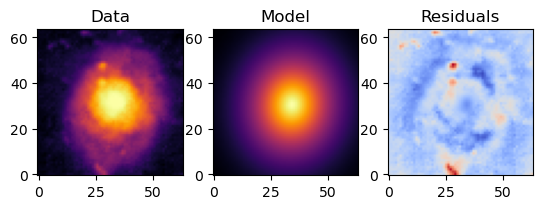

0.5000000000004489


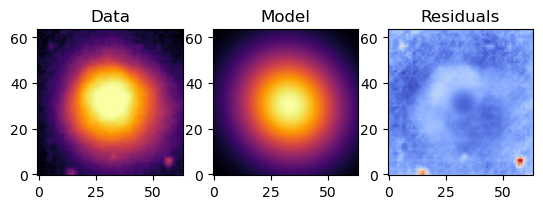

1.5984165665645942


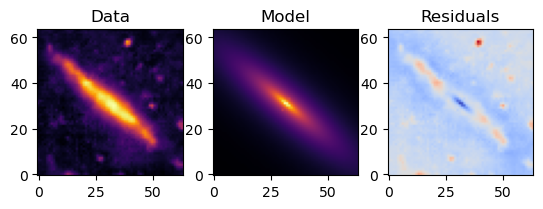

0.9035235414994399


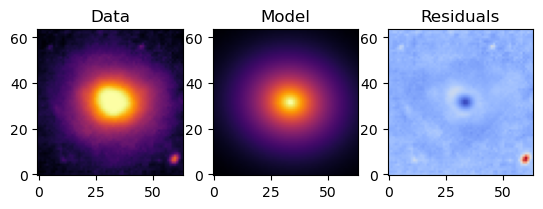

0.7224675431866208


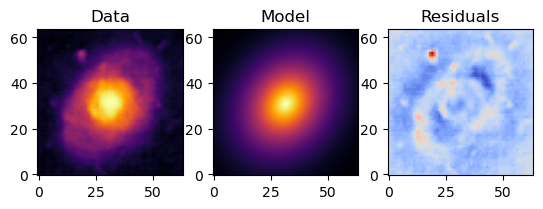

0.6805977230449186


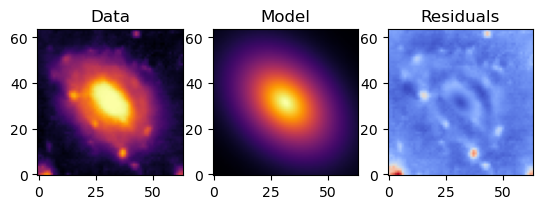

0.9095817574668189


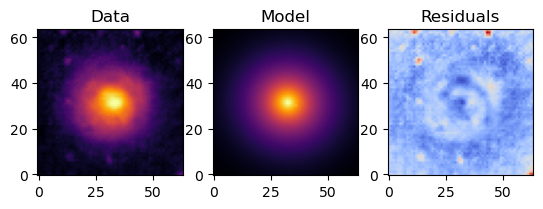

0.9357354522997634


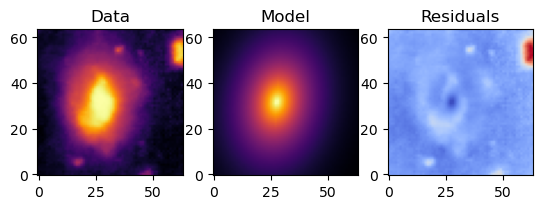

0.7413967845399675


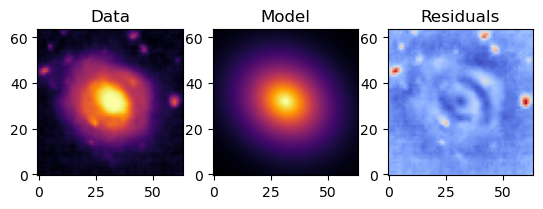

In [20]:
folder = "/Users/jackc/Downloads/new_gals"
filenames = sorted([f for f in os.listdir(folder) if f.endswith('png')])

sersic_values = []
images = []

for filename in filenames:
    filepath = os.path.join(folder, filename)
    with Image.open(filepath) as img:
        img_bw = img.convert("L")
        data = np.array(img_bw) 
        images.append(data) 
        p0 = [np.max(data), 5, 4, .1, .1, np.max(data)/2, 30, 1, .1, .1, 30, 30]
        bounds_lower = [0, 0, 2, 0, 0, 0, 0, .5, 0, 0, 0, 0]
        bounds_upper = [np.inf, 10, 8, 1, 6.28, np.inf, 60, 8, 1, 6.28, data.shape[1], data.shape[0]]
        model_image, n_disk_fit = get_gal_fit(data, p0, bounds_lower, bounds_upper) 
        sersic_values.append(n_disk_fit)
        print(n_disk_fit)
        plot_sersic_fit(data, model_image, data-model_image) 
        

Text(0.5, 1.0, 'Sersic Indices of GAN Output Galaxies')

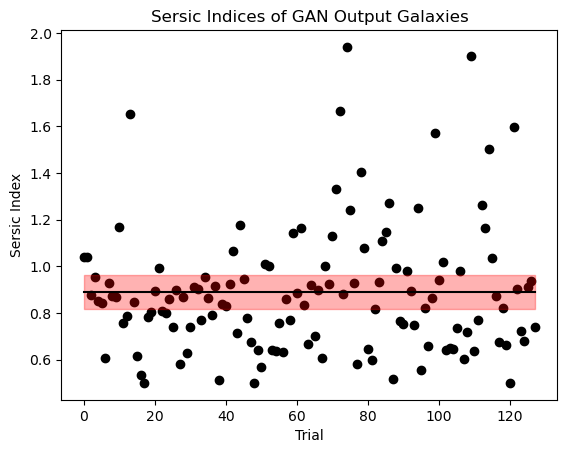

In [24]:
sersic_array = np.array(sersic_values) 
mask = sersic_array < 2
sersic_array = sersic_array[mask]
std = np.std(sersic_array) 
mean = np.mean(sersic_array)
error = std / np.sqrt(len(sersic_array)) 

plt.scatter(np.arange(len(sersic_array)), sersic_array, color = 'black') 
plt.plot(np.arange(len(sersic_array)), np.ones(len(sersic_array))*mean, color = 'black')
plt.fill_between(np.arange(len(sersic_array)), mean+3*(std/np.sqrt(len(sersic_array))), mean-3*(std/np.sqrt(len(sersic_array))), color = 'red', alpha = .3)
plt.xlabel('Trial')
plt.ylabel('Sersic Index')
plt.title('Sersic Indices of GAN Output Galaxies')


In [25]:
folder = "/Users/jackc/Downloads/jack_colvin_projects-main/jack_colvin_projects-main/Astro_Projects/notebooks/Gan Project/Gan_Data"
filenames = sorted([f for f in os.listdir(folder) if f.endswith('jpg')])
sersic_values = []
images = []

for i in range(0, len(filenames), 45):  
    filename = filenames[i]
    filepath = os.path.join(folder, filename)
    with Image.open(filepath) as img:
        img_bw = img.convert("L")
        data = np.array(img_bw) 
        images.append(data) 
        p0 = [np.max(data), 5, 4, .1, .1, np.max(data)/2, 30, 1, .1, .1, 30, 30]
        bounds_lower = [0, 0, 2, 0, 0, 0, 0, .5, 0, 0, 0, 0]
        bounds_upper = [np.inf, 10, 8, 1, 6.28, np.inf, 60, 8, 1, 6.28, data.shape[1], data.shape[0]]
        model_image, n_disk_fit = get_gal_fit(data, p0, bounds_lower, bounds_upper) 
        sersic_values.append(n_disk_fit)

Text(0.5, 1.0, 'Sersic Indices of Training Galaxies (Random Sample)')

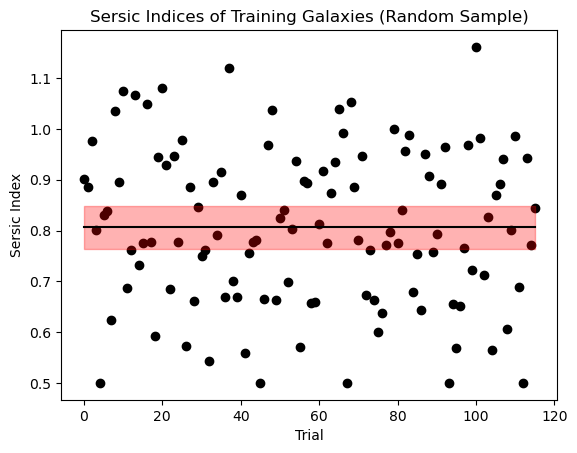

In [26]:
sersic_array = np.array(sersic_values) 
mask = sersic_array < 2
sersic_array = sersic_array[mask]
std = np.std(sersic_array) 
mean = np.mean(sersic_array)
error = std / np.sqrt(len(sersic_array)) 

plt.scatter(np.arange(len(sersic_array)), sersic_array, color = 'black') 
plt.plot(np.arange(len(sersic_array)), np.ones(len(sersic_array))*mean, color = 'black')
plt.fill_between(np.arange(len(sersic_array)), mean+3*(std/np.sqrt(len(sersic_array))), mean-3*(std/np.sqrt(len(sersic_array))), color = 'red', alpha = .3) 
plt.xlabel('Trial')
plt.ylabel('Sersic Index')
plt.title('Sersic Indices of Training Galaxies (Random Sample)')